<a href="https://colab.research.google.com/github/AI-Maddy/SCGAN/blob/main/heart_data_cnn_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# prompt: mount google drive and read heart_attack_dataset.csv from "My Drive/Learning/Stat Pract" and do descriptive analysis

import pandas as pd
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Read the CSV file
file_path = '/content/drive/MyDrive/Learning/Stat Practice/heart_attack_dataset.csv'
try:
  df = pd.read_csv(file_path)
  # Display descriptive statistics
  print(df.describe())
except FileNotFoundError:
  print(f"Error: File not found at {file_path}")
except pd.errors.ParserError:
  print(f"Error: Unable to parse the CSV file at {file_path}")
except Exception as e:
  print(f"An unexpected error occurred: {e}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
                 Age    Cholesterol  BloodPressure      HeartRate  \
count  372974.000000  372974.000000  372974.000000  372974.000000   
mean       56.975151     199.455844     134.508234      89.495043   
std        15.867016      57.723381      25.984528      17.342658   
min        30.000000     100.000000      90.000000      60.000000   
25%        43.000000     149.000000     112.000000      74.000000   
50%        57.000000     199.000000     134.000000      89.000000   
75%        71.000000     249.000000     157.000000     105.000000   
max        84.000000     299.000000     179.000000     119.000000   

                 BMI         Smoker       Diabetes   Hypertension  \
count  372974.000000  372974.000000  372974.000000  372974.000000   
mean       29.006733       0.499225       0.500987       0.500973   
std         6.345460       0.500000       

In [2]:
# prompt: in dataframe df convert all the object type columns as numerical type use an appropriate encoding method based on the values of the column

import pandas as pd
from google.colab import drive


# Mount Google Drive
drive.mount('/content/drive')

# Read the CSV file
file_path = '/content/drive/MyDrive/Learning/Stat Practice/heart_attack_dataset.csv'
try:
  df = pd.read_csv(file_path)
  # Display descriptive statistics
  print(df.describe())

  # Convert object type columns to numerical using appropriate encoding
  for col in df.select_dtypes(include=['object']):
      if df[col].nunique() <= 10:  # Check for low cardinality
          df[col] = df[col].astype('category').cat.codes
      else: # For higher cardinality, use Label Encoding
          from sklearn.preprocessing import LabelEncoder
          le = LabelEncoder()
          df[col] = le.fit_transform(df[col])

  print(df.dtypes)
except FileNotFoundError:
  print(f"Error: File not found at {file_path}")
except pd.errors.ParserError:
  print(f"Error: Unable to parse the CSV file at {file_path}")
except Exception as e:
  print(f"An unexpected error occurred: {e}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
                 Age    Cholesterol  BloodPressure      HeartRate  \
count  372974.000000  372974.000000  372974.000000  372974.000000   
mean       56.975151     199.455844     134.508234      89.495043   
std        15.867016      57.723381      25.984528      17.342658   
min        30.000000     100.000000      90.000000      60.000000   
25%        43.000000     149.000000     112.000000      74.000000   
50%        57.000000     199.000000     134.000000      89.000000   
75%        71.000000     249.000000     157.000000     105.000000   
max        84.000000     299.000000     179.000000     119.000000   

                 BMI         Smoker       Diabetes   Hypertension  \
count  372974.000000  372974.000000  372974.000000  372974.000000   
mean       29.006733       0.499225       0.500987       0.500973   
std         6.345460       0.500000       

In [3]:
# prompt: create a sequential cnn model to do analyse and predict the dataset

import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from sklearn.preprocessing import StandardScaler

# Assuming 'df' is your DataFrame and 'output_column' is the name of your target variable
# Replace 'output_column' with the actual name of your target variable


In [4]:
# prompt: create a sequential cnn model to do analyse and predict the dataset; at least have 5 conv1D layers in the model

# Assuming 'df' is your DataFrame and 'output_column' is the name of your target variable
# Replace 'output_column' with the actual name of your target variable
output_column = 'Outcome'  # Example: Replace with your actual target column name

X = df.drop(output_column, axis=1)
y = df[output_column]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Reshape the input data for Conv1D
X_train = np.expand_dims(X_train, axis=2)
X_test = np.expand_dims(X_test, axis=2)

In [6]:
!pip install tensorflow-addons --upgrade
!pip install --upgrade tensorflow

In [8]:
!pip install tensorflow-addons==0.20.0  # Install a compatible version of tensorflow-addons

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 591.0/591.0 kB 9.3 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-addons
    Found existing installation: tensorflow-addons 0.23.0
    Uninstalling tensorflow-addons-0.23.0:
      Successfully uninstalled tensorflow-addons-0.23.0


In [10]:
import tensorflow as tf
#import tensorflow_addons as tfa # No longer needed
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, LeakyReLU # Import LeakyReLU from keras.layers

# Define the CNN model
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=7, activation=LeakyReLU(alpha=0.2), input_shape=(X_train.shape[1], 1), padding='same')) # Use keras.layers.LeakyReLU
model.add(MaxPooling1D(pool_size=2))
model.add(Conv1D(filters=128, kernel_size=7, activation=LeakyReLU(alpha=0.2), padding='same')) # Use keras.layers.LeakyReLU
model.add(MaxPooling1D(pool_size=2))
model.add(Conv1D(filters=256, kernel_size=7, activation=LeakyReLU(alpha=0.2), padding='same')) # Use keras.layers.LeakyReLU
model.add(MaxPooling1D(pool_size=2))
model.add(Conv1D(filters=128, kernel_size=7, activation=LeakyReLU(alpha=0.2), padding='same')) # Use keras.layers.LeakyReLU
model.add(Conv1D(filters=64, kernel_size=7, activation=LeakyReLU(alpha=0.2), padding='same')) # Use keras.layers.LeakyReLU
model.add(Flatten())
model.add(Dense(10, activation=LeakyReLU(alpha=0.2)))  # Use keras.layers.LeakyReLU
model.add(Dense(1, activation='sigmoid')) # Output layer for binary classification

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [11]:
# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test)) # Adjust epochs and batch size



Epoch 1/10
9325/9325 ━━━━━━━━━━━━━━━━━━━━ 488s 52ms/step - accuracy: 0.4978 - loss: 14.5785 - val_accuracy: 0.5039 - val_loss: 3.4676
Epoch 2/10
9325/9325 ━━━━━━━━━━━━━━━━━━━━ 481s 52ms/step - accuracy: 0.5012 - loss: 77.1612 - val_accuracy: 0.5039 - val_loss: 9.2490
Epoch 3/10
9325/9325 ━━━━━━━━━━━━━━━━━━━━ 483s 52ms/step - accuracy: 0.4998 - loss: 305.0598 - val_accuracy: 0.5039 - val_loss: 9.0427
Epoch 4/10
9325/9325 ━━━━━━━━━━━━━━━━━━━━ 502s 52ms/step - accuracy: 0.4989 - loss: 40.0338 - val_accuracy: 0.4961 - val_loss: 113.8606
Epoch 5/10
9325/9325 ━━━━━━━━━━━━━━━━━━━━ 501s 52ms/step - accuracy: 0.4990 - loss: 96.7393 - val_accuracy: 0.5039 - val_loss: 1.0397
Epoch 6/10
9325/9325 ━━━━━━━━━━━━━━━━━━━━ 499s 51ms/step - accuracy: 0.4993 - loss: 133.8192 - val_accuracy: 0.4961 - val_loss: 16.6314
Epoch 7/10
9325/9325 ━━━━━━━━━━━━━━━━━━━━ 502s 51ms/step - accuracy: 0.5012 - loss: 88.4063 - val_accuracy: 0.5041 - val_loss: 0.7020
Epoch 8/10
9325/9325 ━━━━━━━━━━━━━━━━━━━━ 499s 51ms/step 

In [12]:


# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Test Loss: {loss:.4f}')
print(f'Test Accuracy: {accuracy:.4f}')

2332/2332 ━━━━━━━━━━━━━━━━━━━━ 19s 8ms/step - accuracy: 0.4940 - loss: 1.5828
Test Loss: 1.5786
Test Accuracy: 0.4961


In [2]:
# prompt: copy numerical columns to df1 and categorical columns to df2 from df

df1 = df.select_dtypes(include=['number'])
df2 = df.select_dtypes(exclude=['number'])


In [3]:
# prompt: do EDA of the data frame

# Display information about the DataFrame
print(df.info())

# Display the first few rows of the DataFrame
print(df.head())

# Check for missing values
print(df.isnull().sum())

# Explore data types of each column
print(df.dtypes)



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 372974 entries, 0 to 372973
Data columns (total 32 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Age                    372974 non-null  int64  
 1   Gender                 372974 non-null  object 
 2   Cholesterol            372974 non-null  int64  
 3   BloodPressure          372974 non-null  int64  
 4   HeartRate              372974 non-null  int64  
 5   BMI                    372974 non-null  float64
 6   Smoker                 372974 non-null  int64  
 7   Diabetes               372974 non-null  int64  
 8   Hypertension           372974 non-null  int64  
 9   FamilyHistory          372974 non-null  int64  
 10  PhysicalActivity       372974 non-null  int64  
 11  AlcoholConsumption     372974 non-null  int64  
 12  Diet                   372974 non-null  object 
 13  StressLevel            372974 non-null  int64  
 14  Ethnicity              372974 non-nu

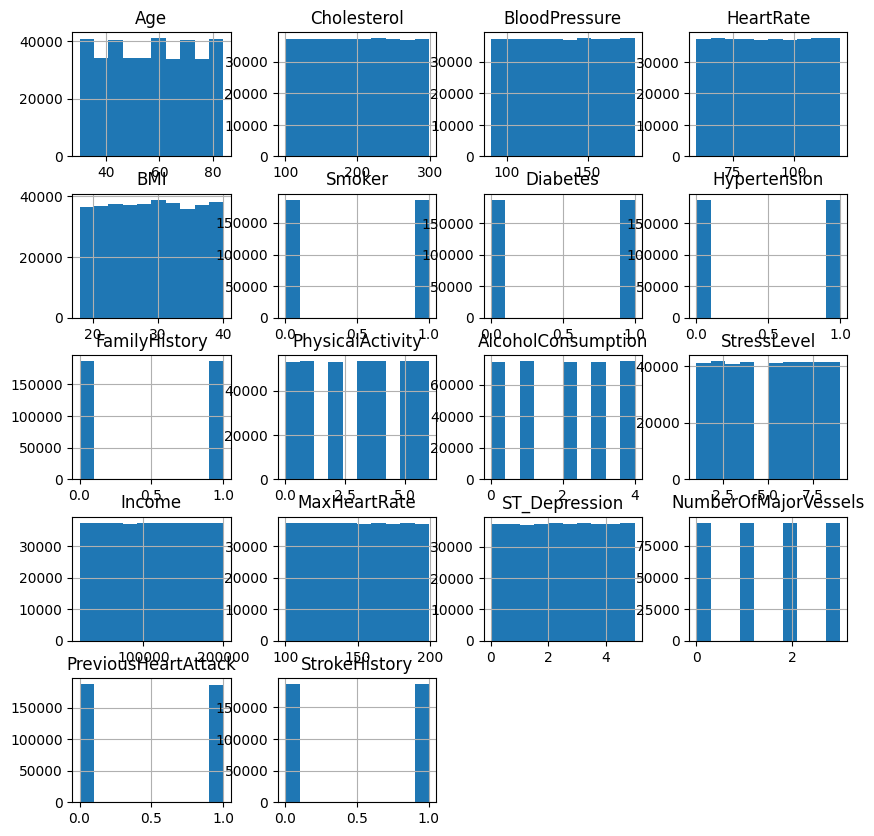

In [4]:
# Visualize distributions of numerical features (example using histograms)
import matplotlib.pyplot as plt
import seaborn as sns

df.hist(figsize=(10, 10))
plt.show()



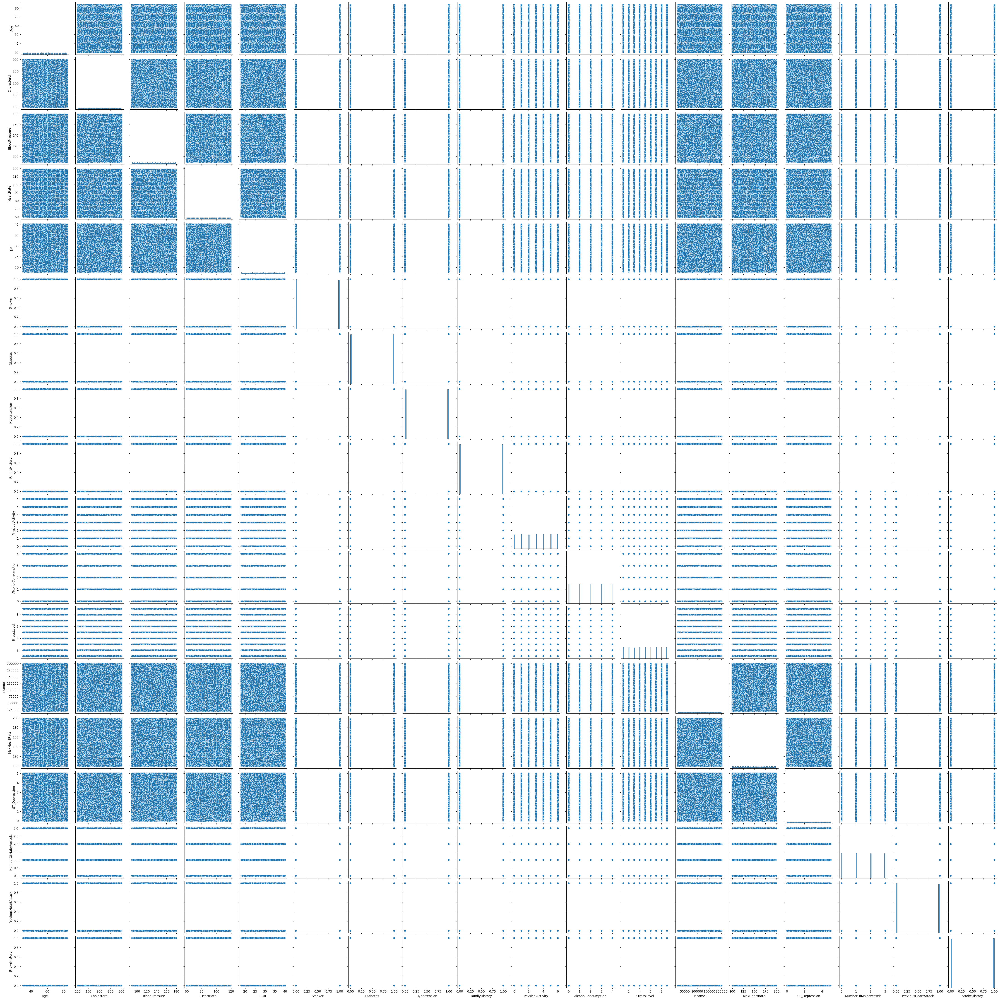

In [5]:
# Visualize relationships between features (example using scatterplots)
sns.pairplot(df)
plt.show()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 372974 entries, 0 to 372973
Data columns (total 32 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Age                    372974 non-null  int64  
 1   Gender                 372974 non-null  object 
 2   Cholesterol            372974 non-null  int64  
 3   BloodPressure          372974 non-null  int64  
 4   HeartRate              372974 non-null  int64  
 5   BMI                    372974 non-null  float64
 6   Smoker                 372974 non-null  int64  
 7   Diabetes               372974 non-null  int64  
 8   Hypertension           372974 non-null  int64  
 9   FamilyHistory          372974 non-null  int64  
 10  PhysicalActivity       372974 non-null  int64  
 11  AlcoholConsumption     372974 non-null  int64  
 12  Diet                   372974 non-null  object 
 13  StressLevel            372974 non-null  int64  
 14  Ethnicity              372974 non-nu

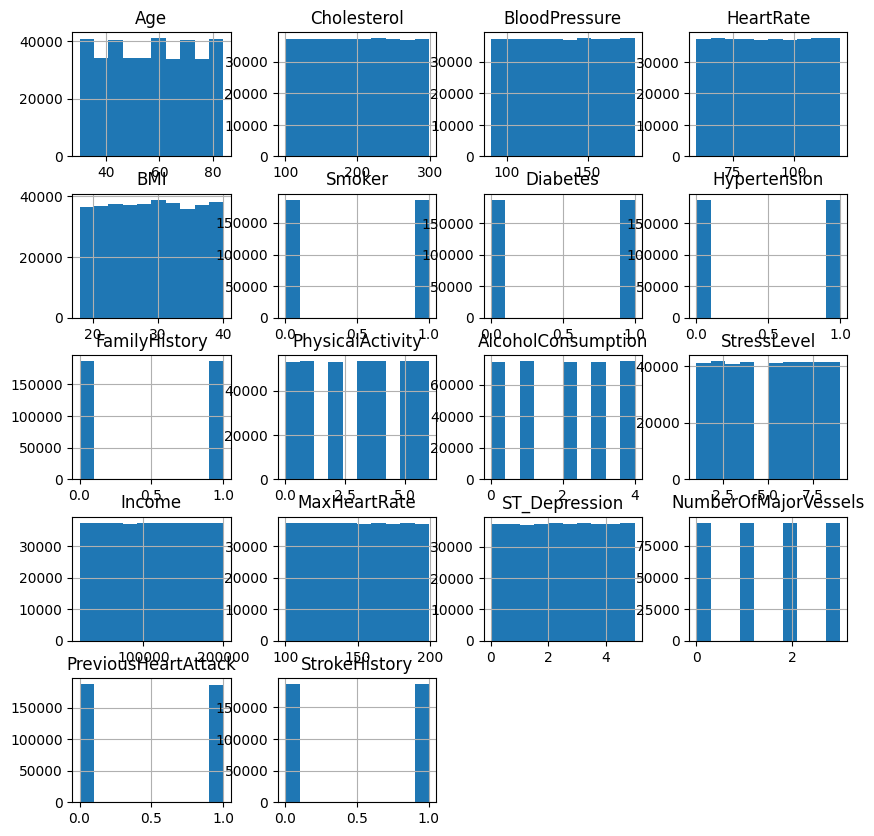

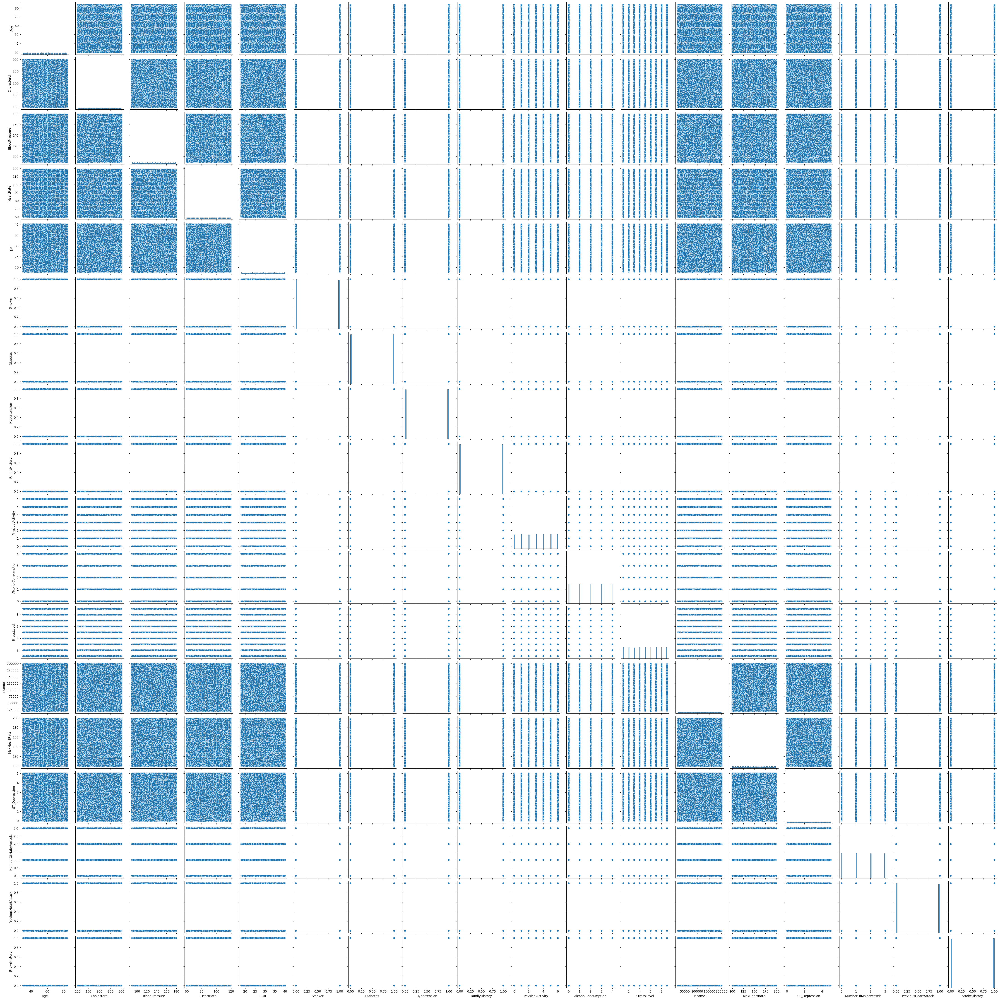

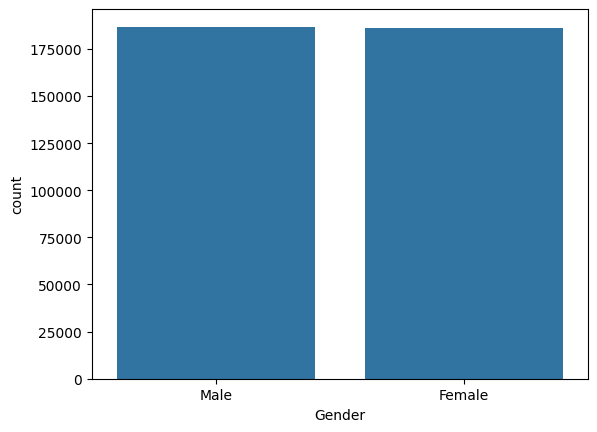

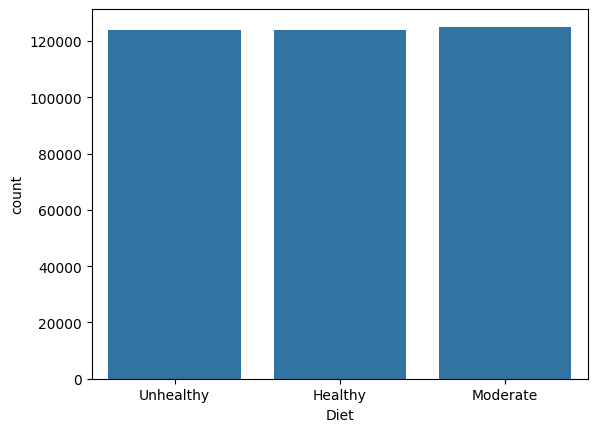

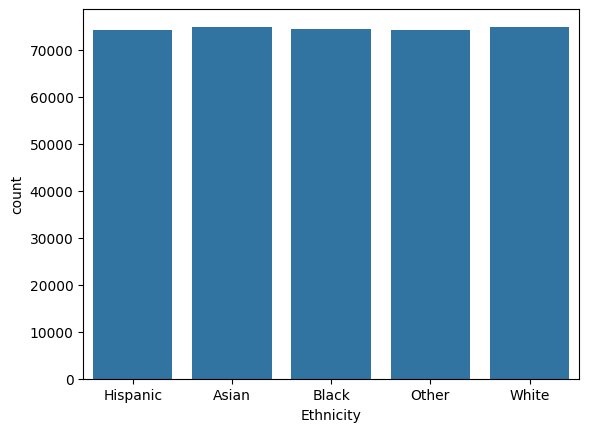

...

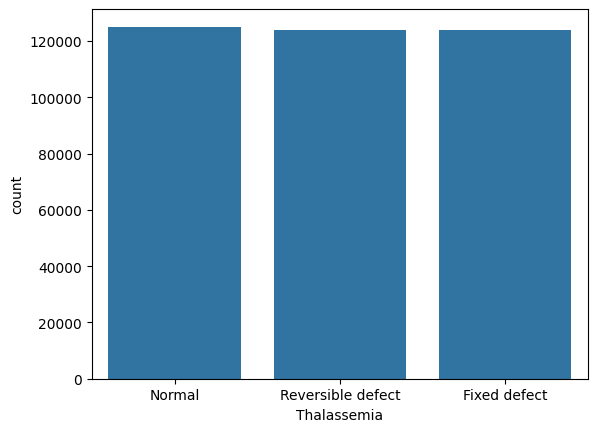

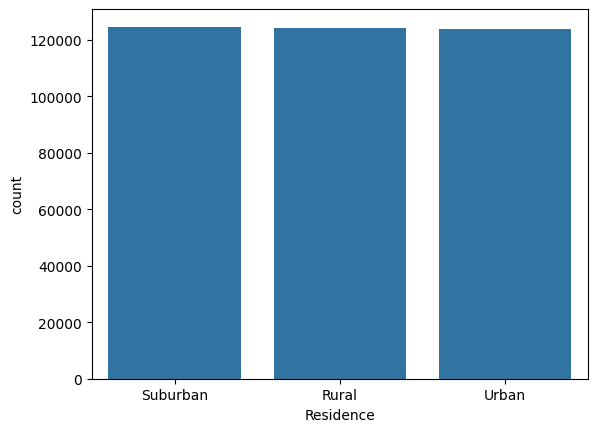

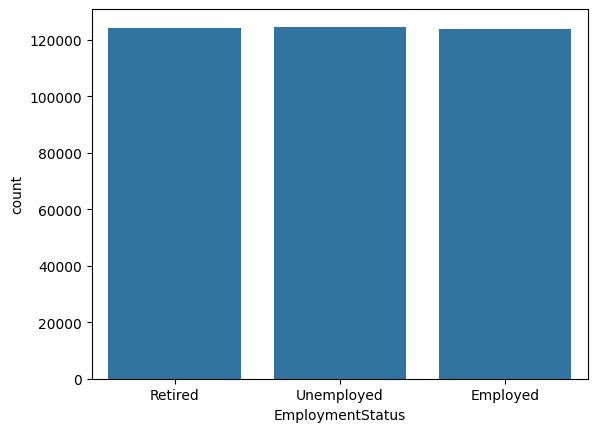

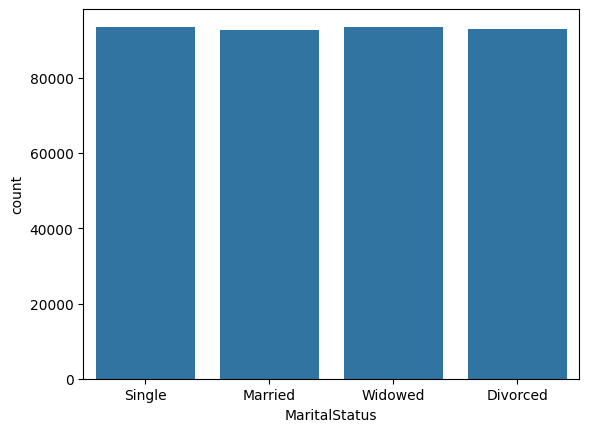

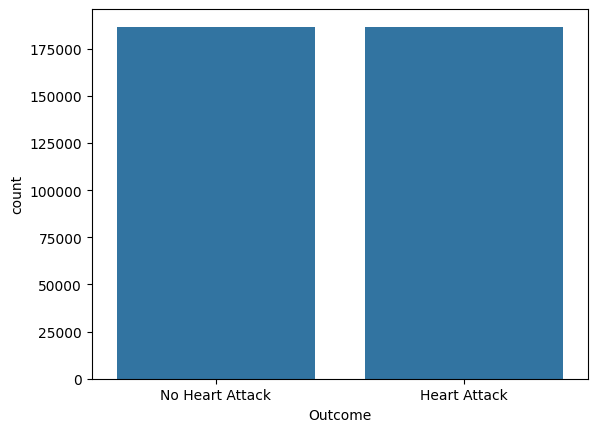

In [9]:
# Explore categorical features (example using countplots)
for col in df.select_dtypes(include=['object', 'category']):
  sns.countplot(x=col, data=df)
  plt.show()

# Box plots for numerical features against a target variable (if you have one)
# Example: assuming 'output' is your target variable
# sns.boxplot(x='output', y='age', data=df) # Replace 'age' with numerical features
# plt.show()


In [12]:
df.columns

Index(['Age', 'Gender', 'Cholesterol', 'BloodPressure', 'HeartRate', 'BMI',
       'Smoker', 'Diabetes', 'Hypertension', 'FamilyHistory',
       'PhysicalActivity', 'AlcoholConsumption', 'Diet', 'StressLevel',
       'Ethnicity', 'Income', 'EducationLevel', 'Medication', 'ChestPainType',
       'ECGResults', 'MaxHeartRate', 'ST_Depression', 'ExerciseInducedAngina',
       'Slope', 'NumberOfMajorVessels', 'Thalassemia', 'PreviousHeartAttack',
       'StrokeHistory', 'Residence', 'EmploymentStatus', 'MaritalStatus',
       'Outcome'],
      dtype='object')

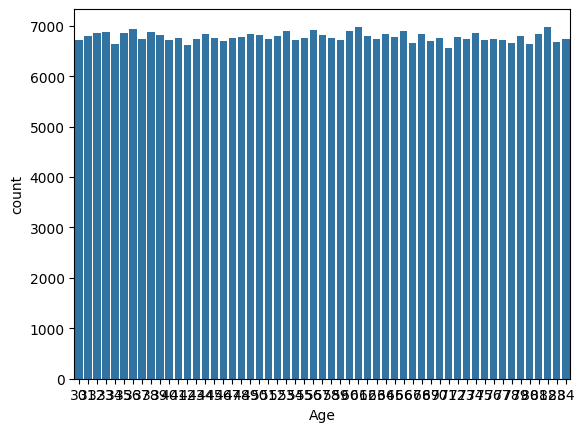

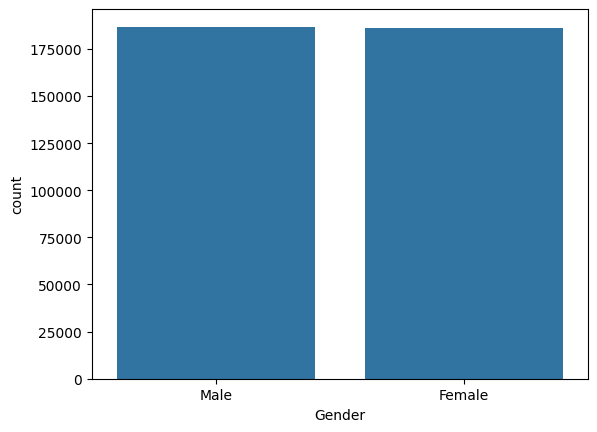

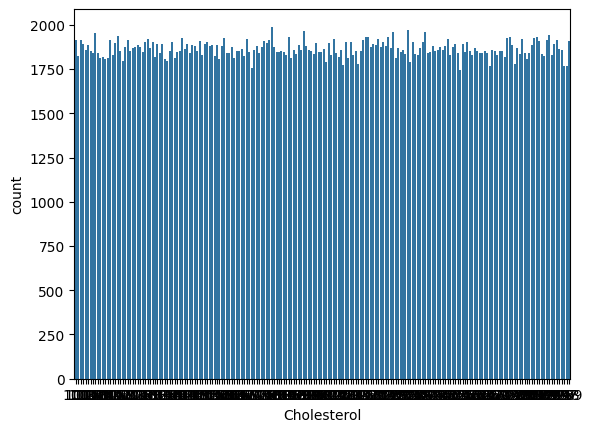

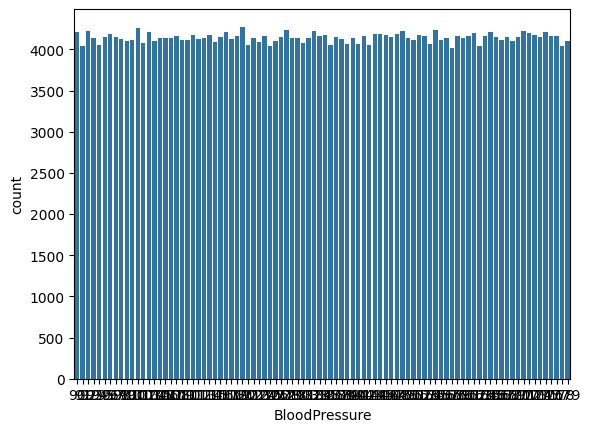

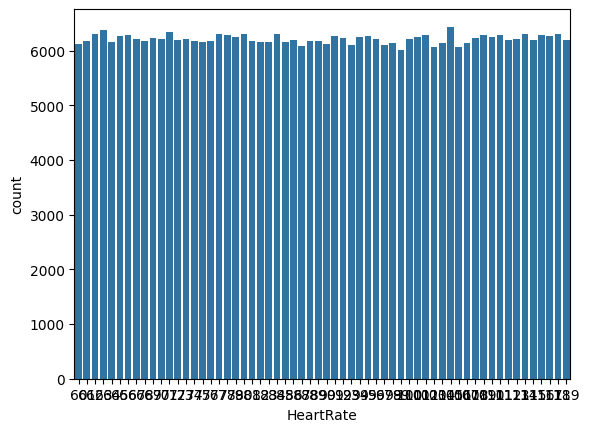

...

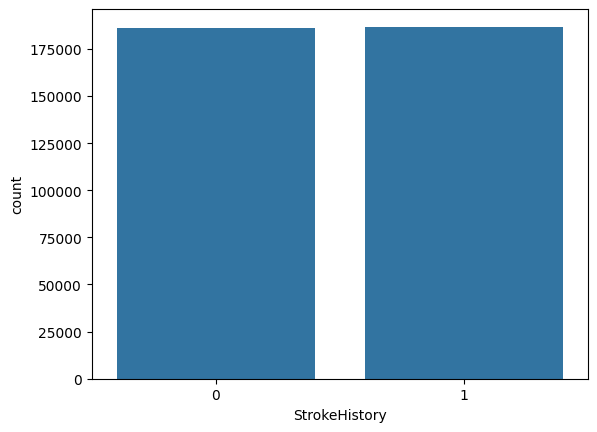

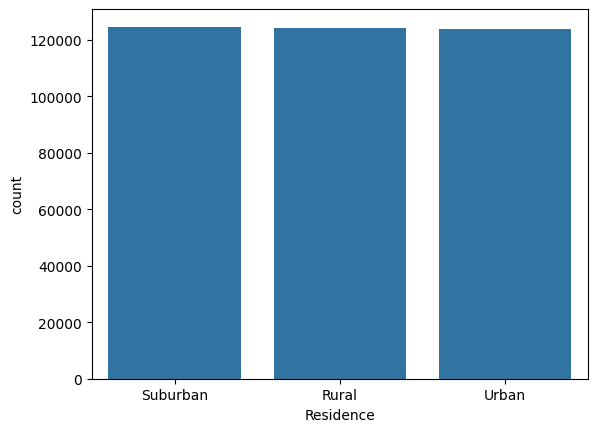

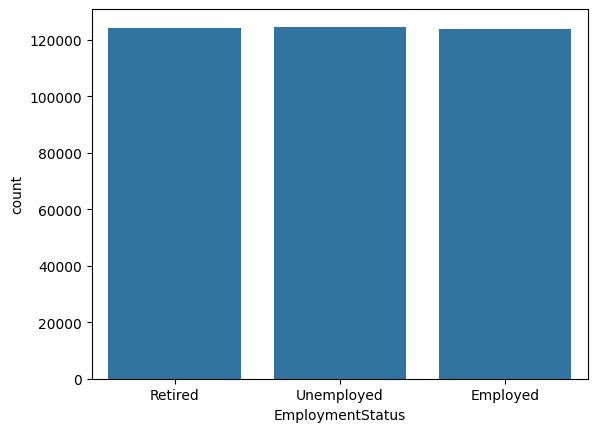

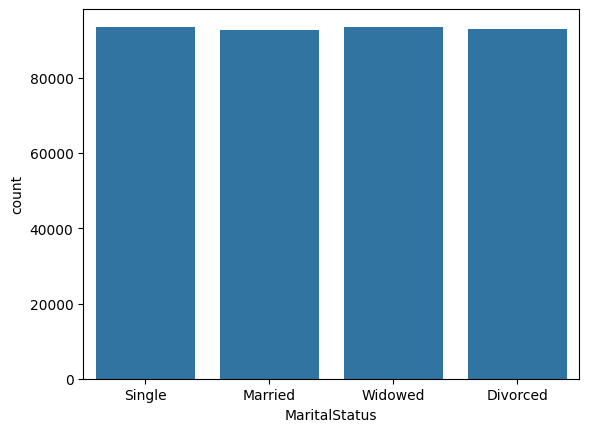

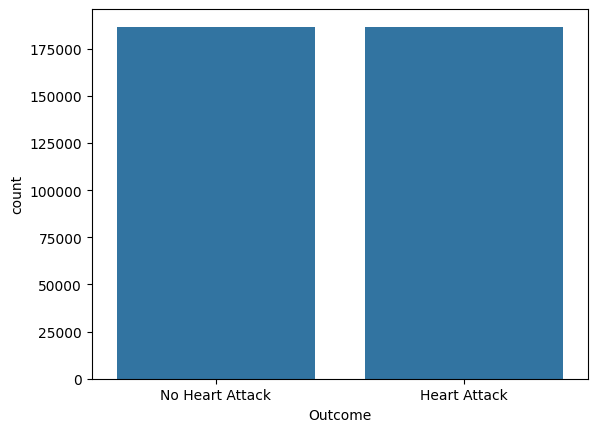

In [19]:
# prompt: create a countplot using seaborn and df

# Assuming 'output' is your target variable. Replace 'output' with the actual target variable column name if different.
for a in df.columns:
  sns.countplot(x=a, data=df)
  plt.show()


In [12]:
# prompt: using one shot encoding convert categorical columns of df

from sklearn.preprocessing import OneHotEncoder

# Create a OneHotEncoder object
enc = OneHotEncoder(handle_unknown='ignore')

# Fit the encoder on the categorical columns
enc.fit(df2)

# Transform the categorical columns into one-hot encoded features
num_df2 = enc.transform(df2).toarray()

# Create a new DataFrame from the one-hot encoded features
df2_encoded = pd.DataFrame(num_df2)

# Concatenate the numerical and one-hot encoded DataFrames
df_encoded = pd.concat([df1, df2_encoded], axis=1)

# Print the first few rows of the combined DataFrame
print(df_encoded.head())


   Age  Cholesterol  BloodPressure  HeartRate   BMI  Smoker  Diabetes  \
0   31          194            162         71  22.9       0         1   
1   69          208            148         93  33.9       1         1   
2   34          132            161         94  34.0       0         0   
3   53          268            134         91  35.0       0         1   
4   57          203            140         75  30.1       0         1   

   Hypertension  FamilyHistory  PhysicalActivity  ...   32   33   34   35  \
0             0              0                 6  ...  0.0  0.0  1.0  0.0   
1             0              0                 1  ...  0.0  0.0  0.0  1.0   
2             1              1                 1  ...  0.0  0.0  1.0  0.0   
3             1              0                 6  ...  0.0  0.0  1.0  0.0   
4             0              0                 4  ...  0.0  0.0  1.0  0.0   

    36   37   38   39   40   41  
0  0.0  0.0  1.0  0.0  0.0  1.0  
1  0.0  1.0  0.0  0.0  0.0  1.

In [10]:
# Calculate correlation between numerical features
print(df1.corr())

                           Age  Cholesterol  BloodPressure  HeartRate  \
Age                   1.000000     0.004333       0.000662  -0.003064   
Cholesterol           0.004333     1.000000       0.003120   0.002186   
BloodPressure         0.000662     0.003120       1.000000   0.000545   
HeartRate            -0.003064     0.002186       0.000545   1.000000   
BMI                   0.000928     0.003879      -0.001592   0.000250   
Smoker               -0.001535    -0.001386       0.002798   0.003537   
Diabetes              0.000910     0.001099       0.000714   0.000185   
Hypertension         -0.000724    -0.001604       0.001351   0.000059   
FamilyHistory         0.000826    -0.001823      -0.000945   0.000530   
PhysicalActivity     -0.000569    -0.000145      -0.002249  -0.001493   
AlcoholConsumption    0.001037     0.001719      -0.001366  -0.000882   
StressLevel           0.000054    -0.001245       0.001740  -0.001503   
Income                0.000072     0.002106       0

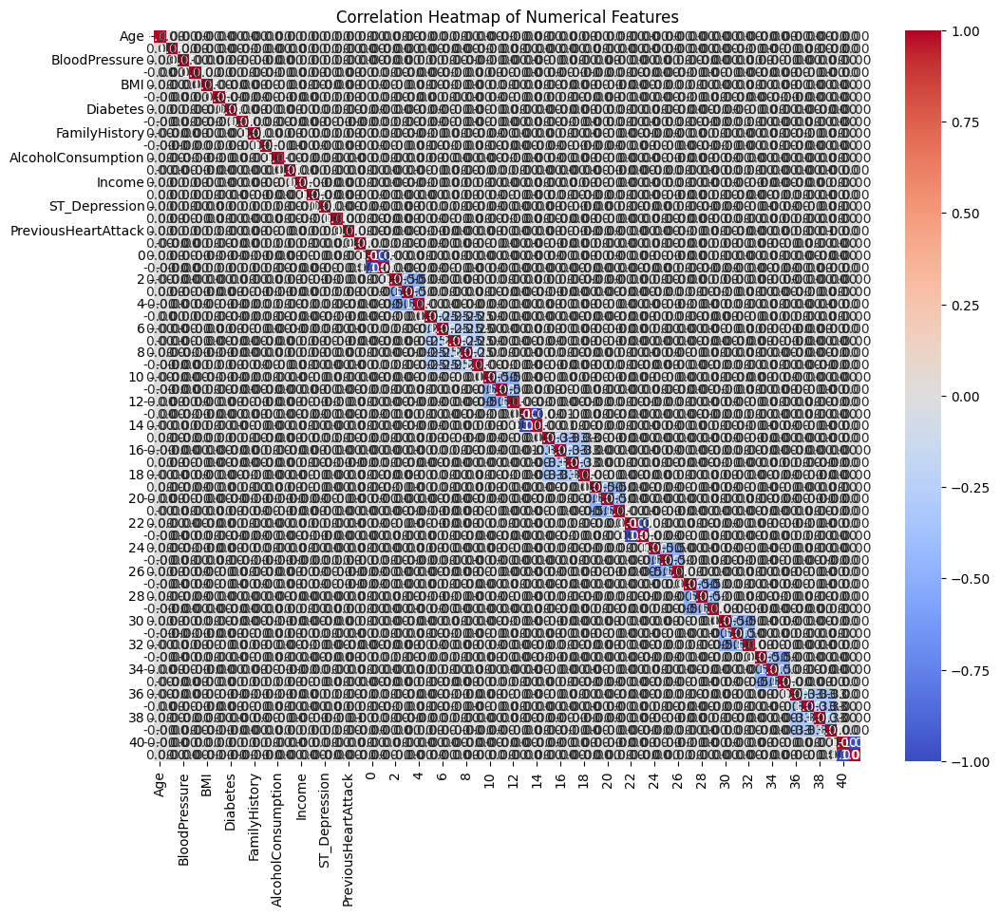

In [13]:
# prompt: provide the heatmap of df

# Create the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(df_encoded.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Numerical Features')
plt.show()
